In [ ]:
#%rm -rf /content/yolov5_switch/yolov5
%rm -rf /content/yolov5_signature
%mkdir /content/yolov5_signature

In [ ]:
# clone YOLOv5 repository
#%mkdir /content/yolov5_mask/yolov5
%cd /content/yolov5_signature
!git clone https://github.com/ultralytics/yolov5  # clone repo
!git pull
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

/content/yolov5_signature
Cloning into 'yolov5'...
remote: Enumerating objects: 9818, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 9818 (delta 6), reused 4 (delta 0), pack-reused 9796
Receiving objects: 100% (9818/9818), 10.27 MiB | 11.49 MiB/s, done.
Resolving deltas: 100% (6782/6782), done.
fatal: not a git repository (or any of the parent directories): .git
fatal: not a git repository (or any of the parent directories): .git


In [ ]:
%cd /content/yolov5_signature/yolov5
!pip install -qr requirements.txt
!pip install thop
!pip install utils
!pip install google_utils
!pip install wandb
!pip install coremltools>=4.1 onnx>=1.8.1
import torch
from IPython.display import Image, clear_output
#from utils.google_utils import gdrive_download
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

/content/yolov5_signature/yolov5
     |████████████████████████████████| 596 kB 4.0 MB/s 
     |████████████████████████████████| 1.7 MB 4.1 MB/s 
     |████████████████████████████████| 180 kB 64.5 MB/s 
     |████████████████████████████████| 139 kB 70.4 MB/s 
     |████████████████████████████████| 97 kB 5.3 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=03a654f56b32f05535bb82c21be3870606a0821acb8b1656eb1255e208c2ebd1
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=c242684ab921a886c7dc25dbab32edda84a4d68db10151d51126b4a45891f7f2
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools
Setup complete. Using torch 1.9.0+cu111 CPU


# New Section

In [ ]:
%mkdir /content/yolov5_signature/signature_data
%cd /content/yolov5_signature/signature_data
!curl -L "https://app.roboflow.com/ds/ZFiD37k89X?key=f1D7pjJHNR" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/images/hgp21c00-var_png.rf.1f767134b509481d318e67e3a094a6f1.jpg  
 extracting: train/images/hgp21c00-var_png.rf.5a2fbcf14d228d9a3c0387d1a3796da8.jpg  
 extracting: train/images/hgp21c00-var_png.rf.cf3672e879a206e509799c375b7ce5f9.jpg  
 extracting: train/images/hhz25e00_png.rf.323e2ad57714dcb558f8446daa43087e.jpg  
 extracting: train/images/hhz25e00_png.rf.4119f33382ece19343e65985cc59b19d.jpg  
 extracting: train/images/hhz25e00_png.rf.df4861d133b11091810fc450d2be3c6a.jpg  
 extracting: train/images/hki32e00_png.rf.70c5deccfae62712d195bbf451a8b6ad.jpg  
 extracting: train/images/hki32e00_png.rf.bf775b219deed232f3c929155c50cf64.jpg  
 extracting: train/images/hki32e00_png.rf.dfca5dfd189286c5700a2abe7c105ef0.jpg  
 extracting: train/images/hlm6aa00-init_png.rf.6be98d8575eb5adb29003d68f228b476.jpg  
 extracting: train/images/hlm6aa00-init_png.rf.e12986f0e6bb3fe5771bb4d3516c4283.jpg  
 extracting: train/images/hlm6aa00-i

In [ ]:
%cat /content/yolov5_signature/signature_data/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Signature']

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
    with open(line,'w') as f:
      f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5_signature/yolov5/custom_signature_data.yaml
train: /content/yolov5_signature/signature_data/train/images
val: /content/yolov5_signature/signature_data/valid/images

nc: 1
names: ['Signature']

In [ ]:
import yaml
%cd /content/yolov5_signature/yolov5
with open("custom_signature_data.yaml",'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

print(num_classes)

/content/yolov5_signature/yolov5
1


In [ ]:
%%writetemplate /content/yolov5_signature/yolov5/models/custom_yolov5s_signature.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%%time
!git pull
%cd /content/yolov5_signature/yolov5/
!python train.py --img 416 --batch 20 --epochs 1000 --data './custom_signature_data.yaml' --cfg ./models/custom_yolov5s_signature.yaml --weights '' --name yolov5s_results_signature --cache

Already up to date.
/content/yolov5_signature/yolov5
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
train: weights=, cfg=./models/custom_yolov5s_signature.yaml, data=./custom_signature_data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=1000, batch_size=20, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results_signature, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

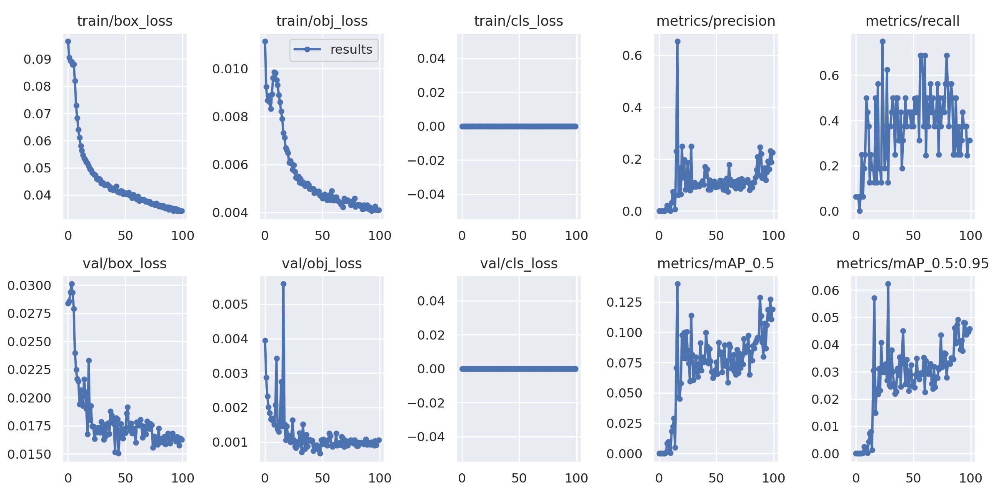

In [ ]:
from utils.plots import plot_results
Image(filename = '/content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature/results.png', width = 1000)

GROUND TRUTH TRAINING DATA: 


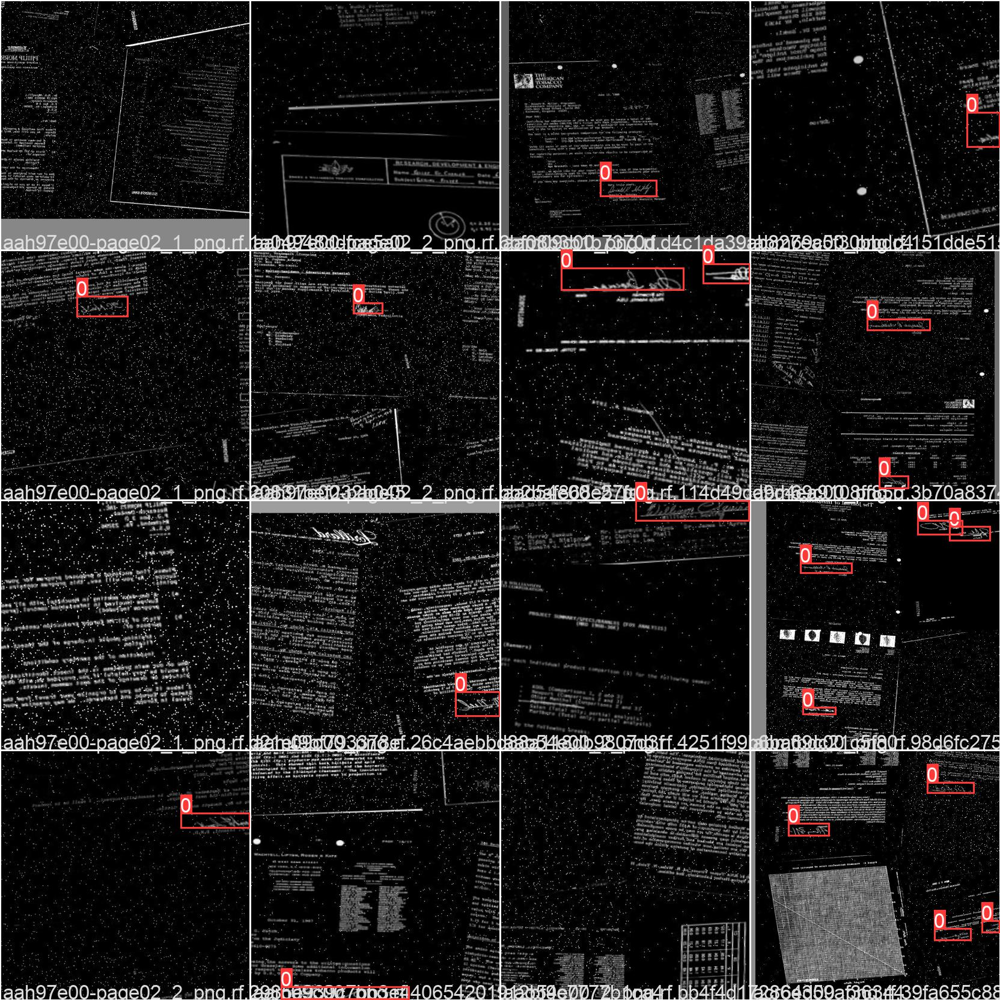

In [ ]:
print("GROUND TRUTH TRAINING DATA: ")
Image(filename='/content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature/train_batch0.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA: 


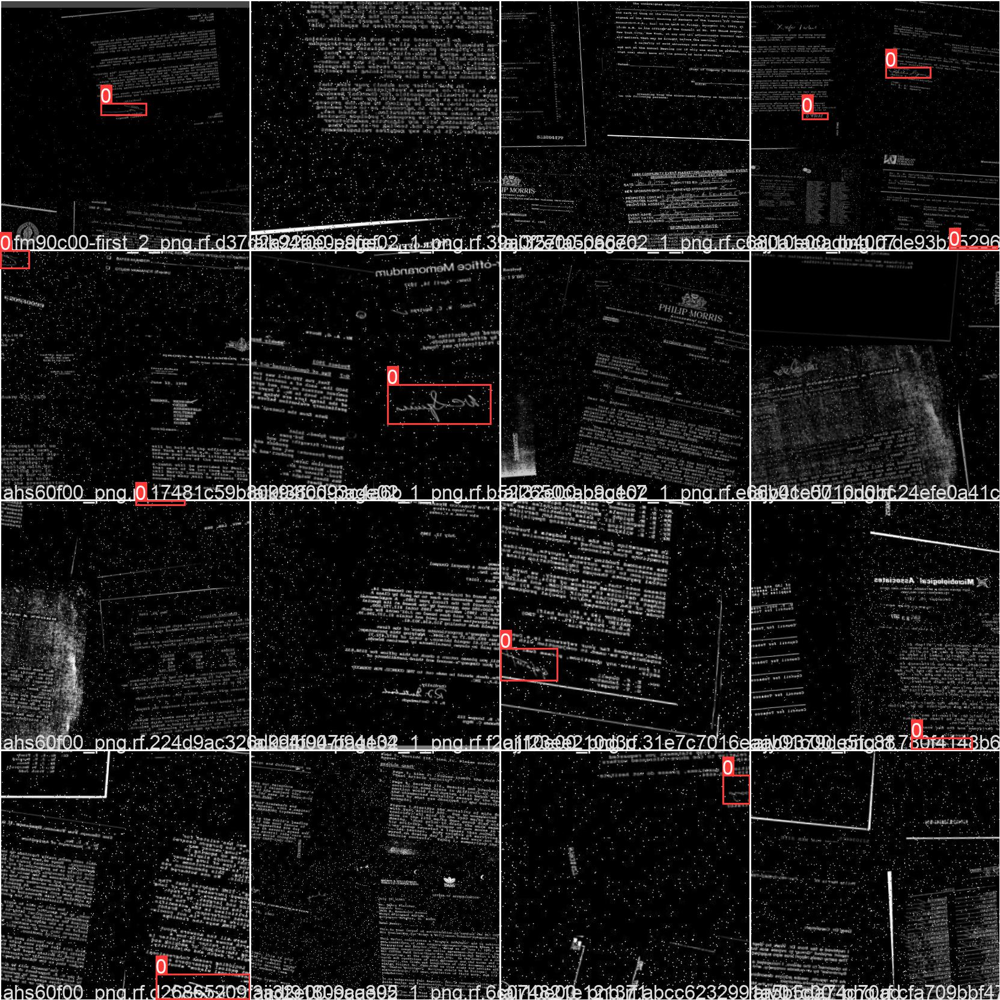

In [ ]:
print("GROUND TRUTH AUGMENTED TRAINING DATA: ")
Image(filename='/content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature/train_batch1.jpg', width=900)

In [ ]:
%ls runs/train/yolov5s_results_signature/weights

best.pt  last.pt


In [ ]:
%cd /content/yolov5_signature/yolov5/
!python detect.py --weights runs/train/yolov5s_results_signature/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5_signature/signature_data/test/images --save-txt

/content/yolov5_signature/yolov5
detect: weights=['runs/train/yolov5s_results_signature/weights/best.pt'], source=/content/yolov5_signature/signature_data/test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-42-g4c0982a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients, 16.8 GFLOPs
image 1/129 /content/yolov5_signature/signature_data/test/images/adh36e00_2_png.rf.2561a4645cbf1a1948a6961140cb5a63.jpg: 416x416 Done. (0.031s)
image 2/129 /content/yolov5_signature/signature_data/test/images/agw39d00_png.rf.30686b9f8c80ea362b1fe9d09bae7392.jpg: 416x416 1 Signature, Done. (0.030s)
image 3/12

In [ ]:
%cd /content/yolov5_signature/yolov5/
!python detect.py --weights runs/train/yolov5s_results_signature/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5_signature/signature_data/test/images --save-txt

/content/yolov5_signature/yolov5
detect: weights=['runs/train/yolov5s_results_signature/weights/best.pt'], source=/content/yolov5_signature/signature_data/test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-42-g4c0982a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients, 16.8 GFLOPs
image 1/129 /content/yolov5_signature/signature_data/test/images/adh36e00_2_png.rf.2561a4645cbf1a1948a6961140cb5a63.jpg: 416x416 Done. (0.030s)
image 2/129 /content/yolov5_signature/signature_data/test/images/agw39d00_png.rf.30686b9f8c80ea362b1fe9d09bae7392.jpg: 416x416 1 Signature, Done. (0.030s)
image 3/12

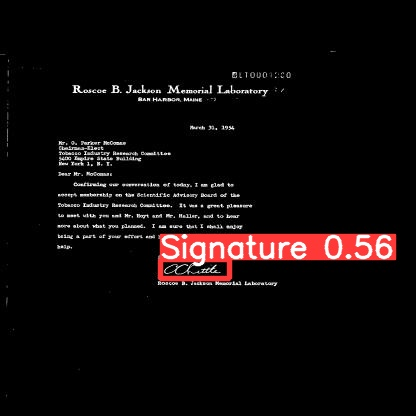

/n


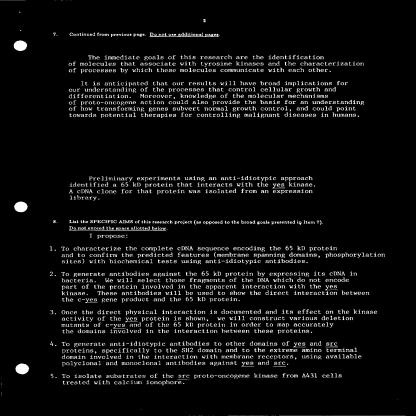

/n


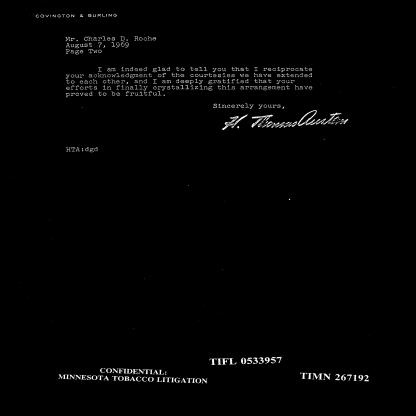

/n


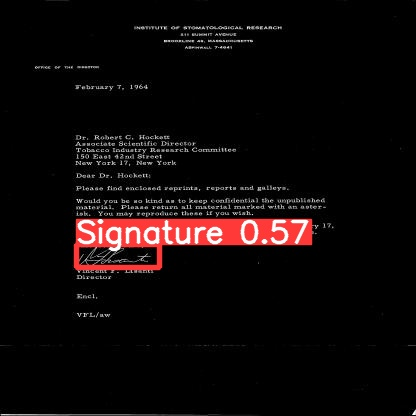

/n


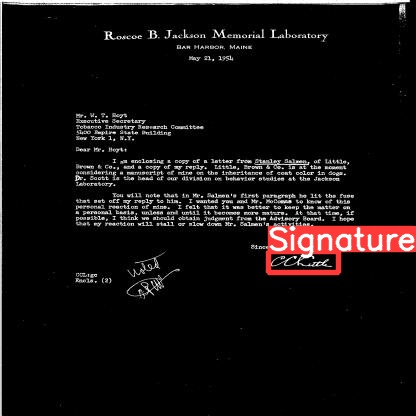

/n


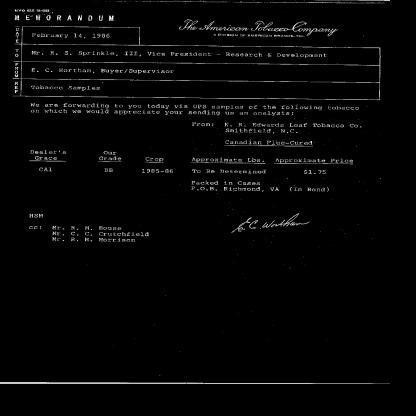

/n


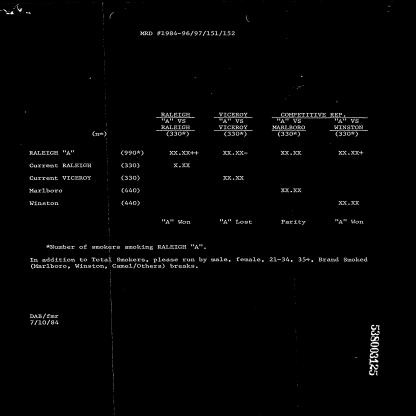

/n


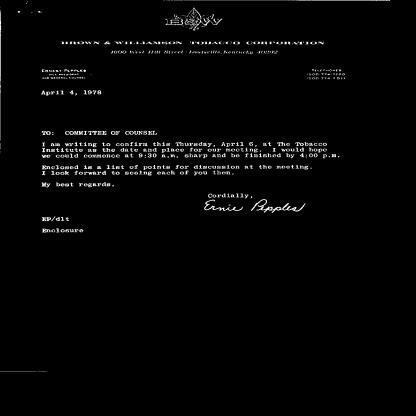

/n


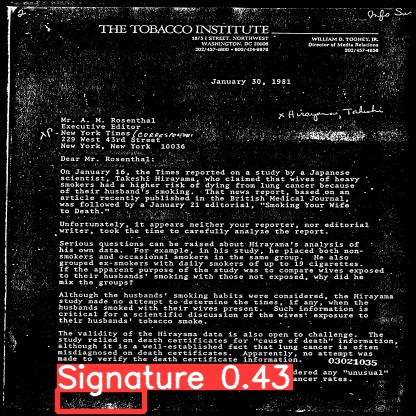

/n


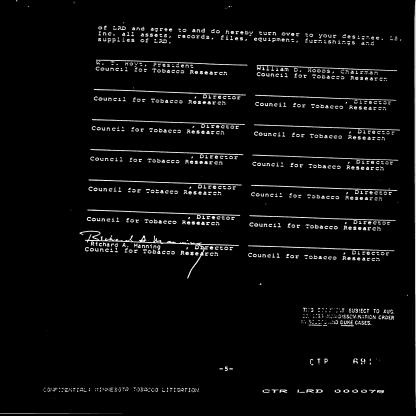

/n


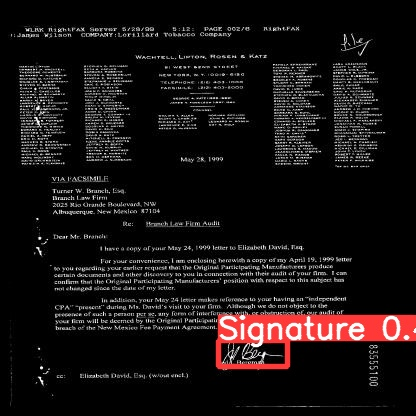

/n


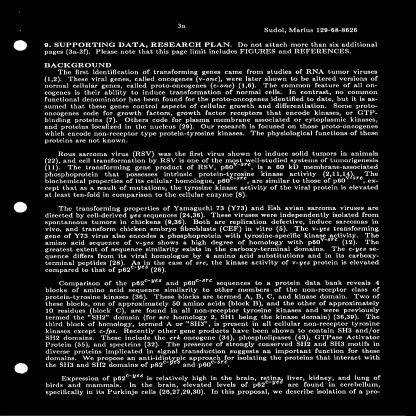

/n


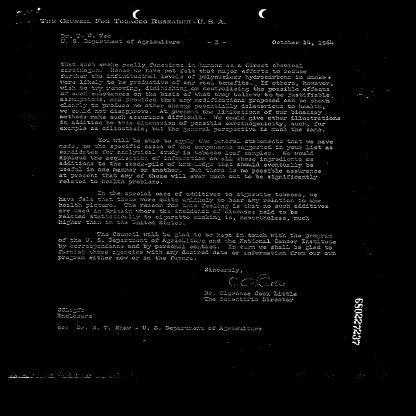

/n


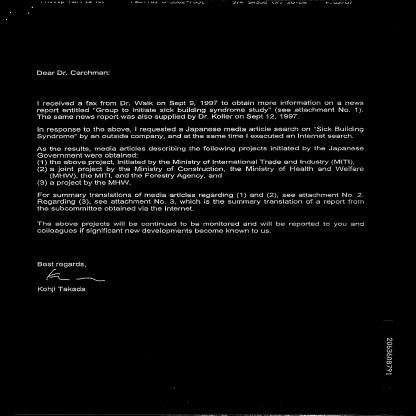

/n


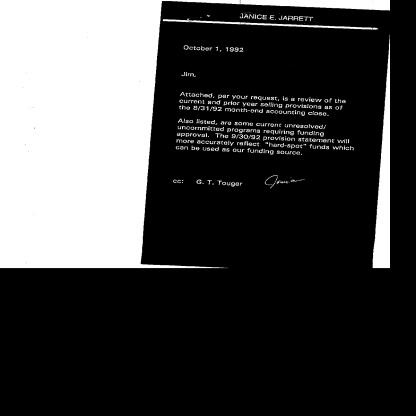

/n


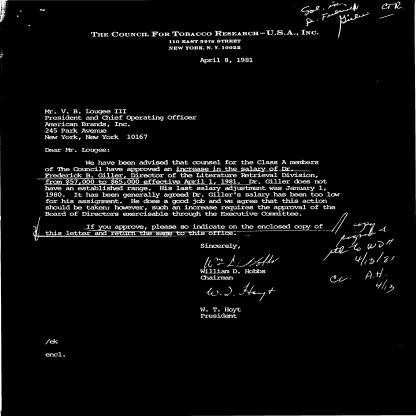

/n


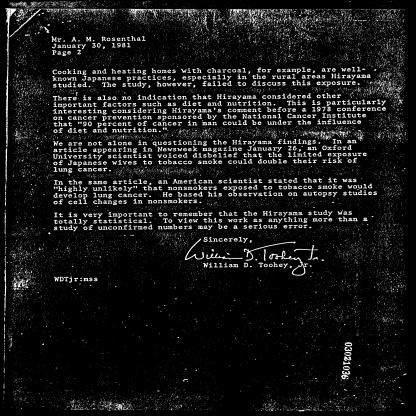

/n


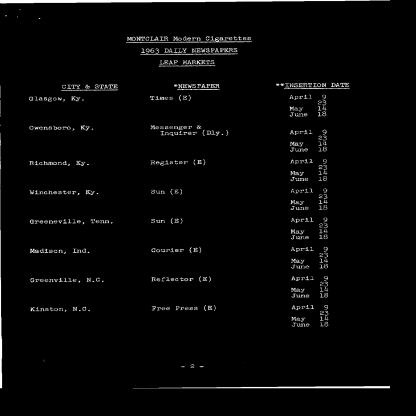

/n


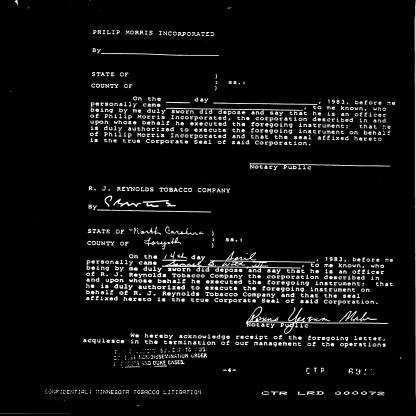

/n


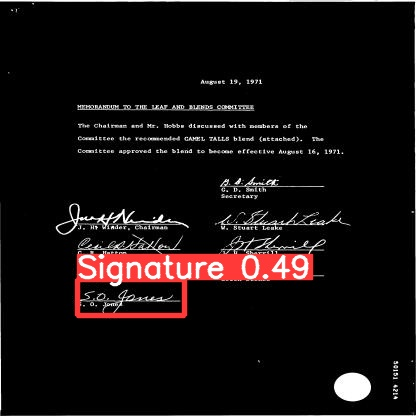

/n


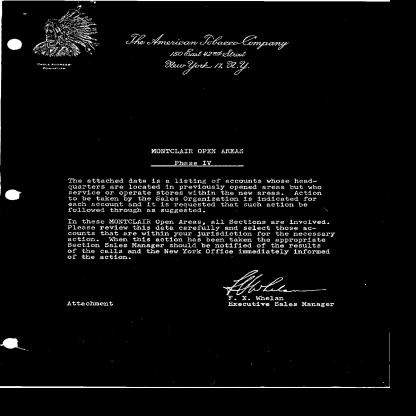

/n


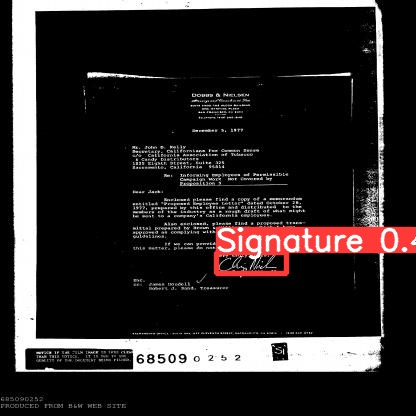

/n


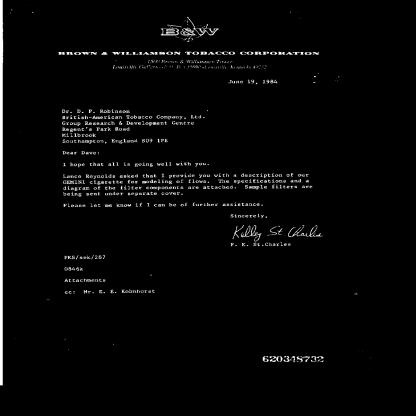

/n


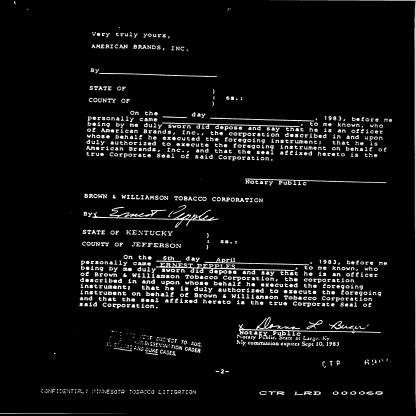

/n


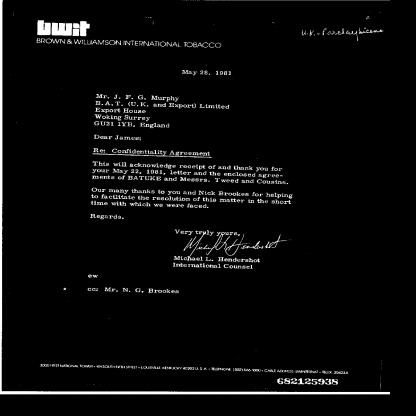

/n


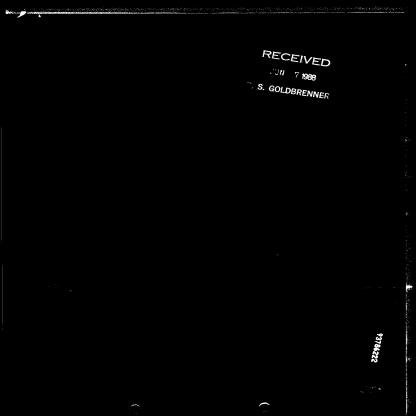

/n


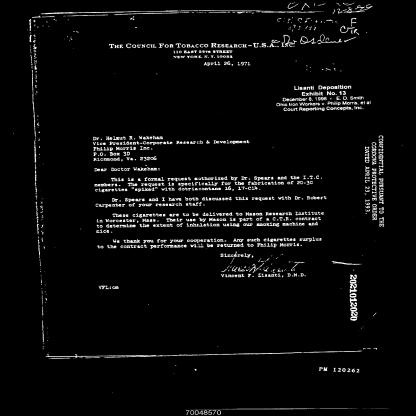

/n


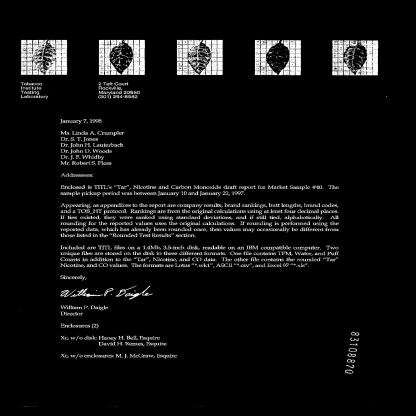

/n


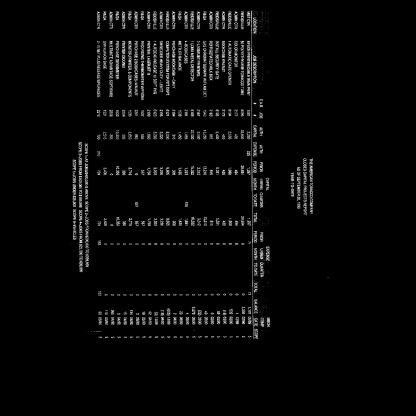

/n


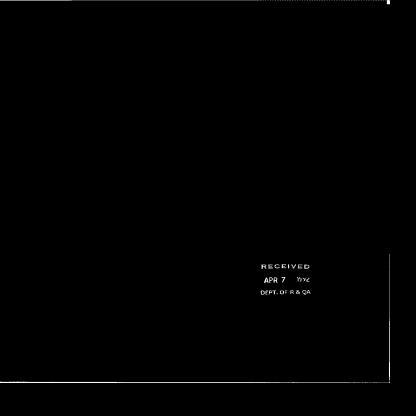

/n


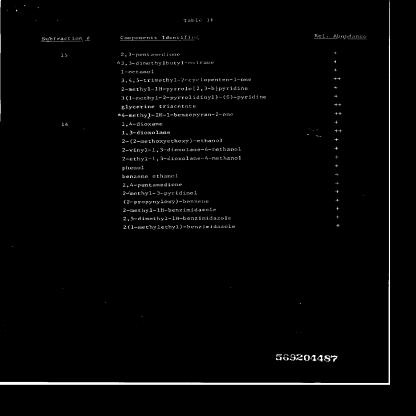

/n


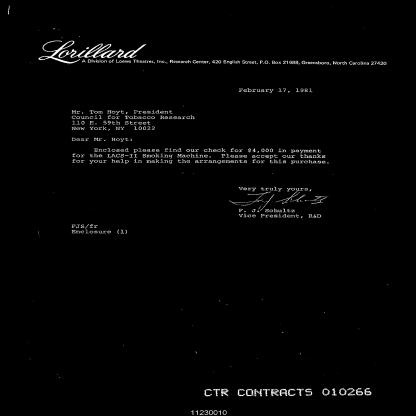

/n


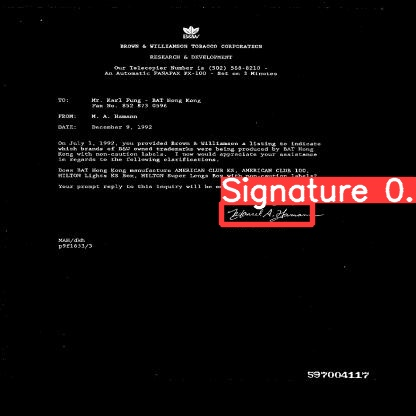

/n


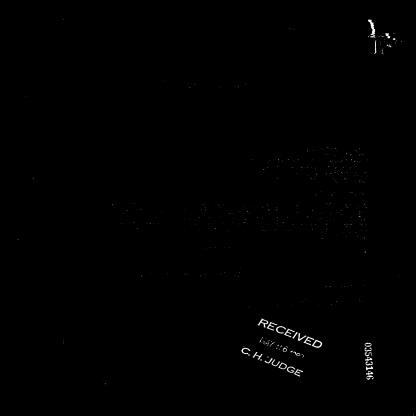

/n


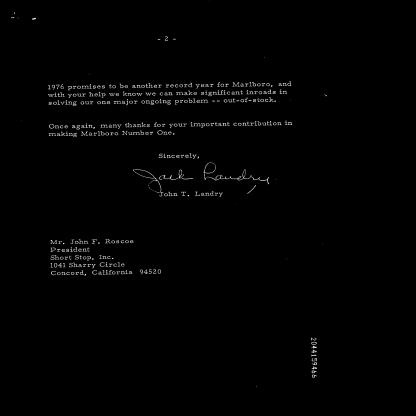

/n


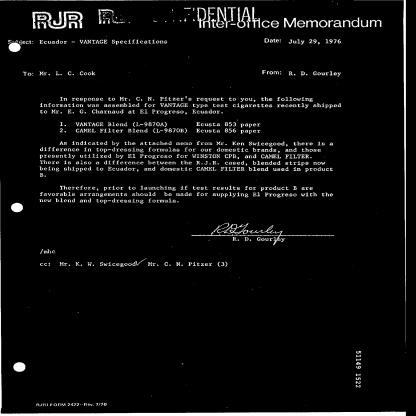

/n


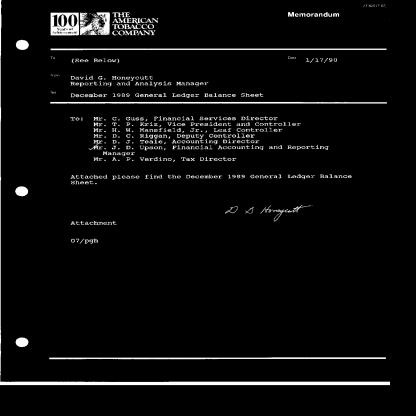

/n


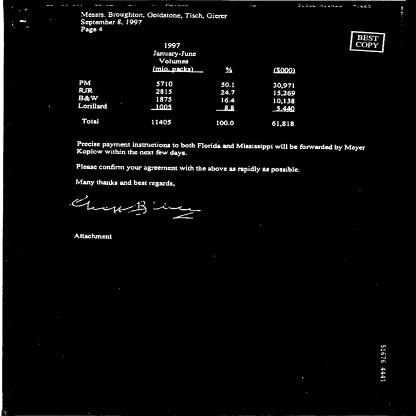

/n


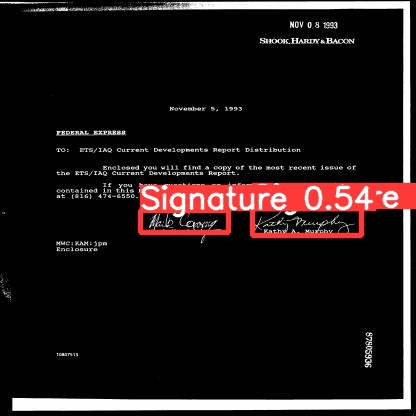

/n


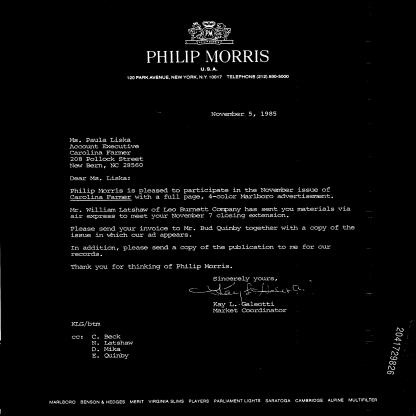

/n


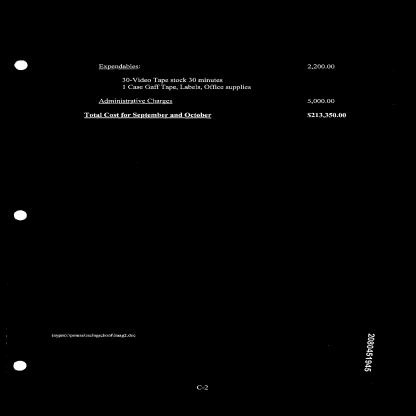

/n


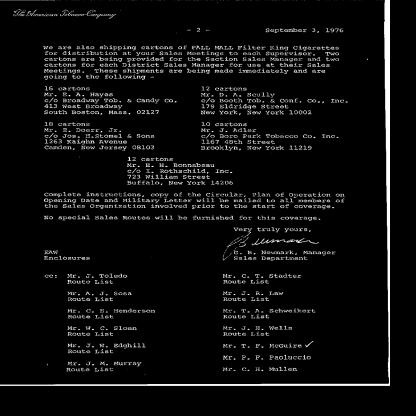

/n


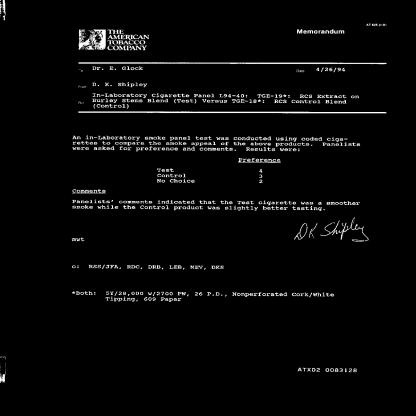

/n


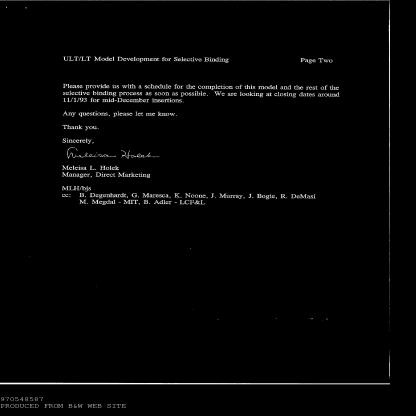

/n


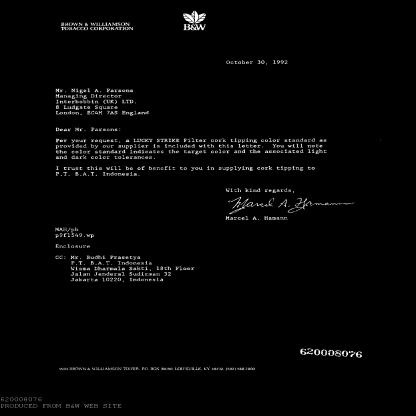

/n


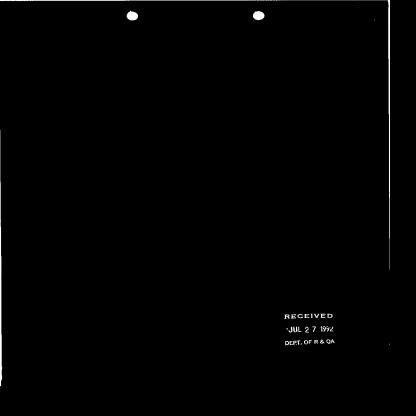

/n


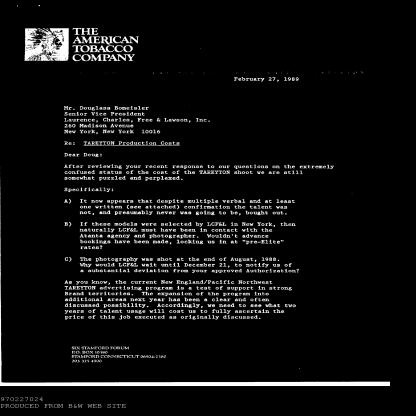

/n


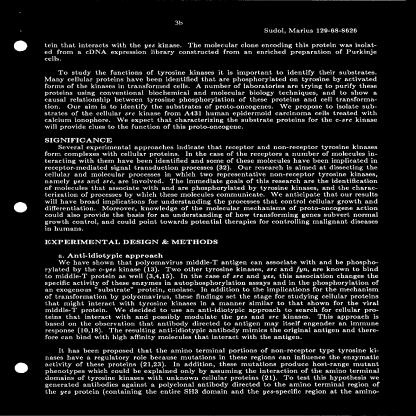

/n


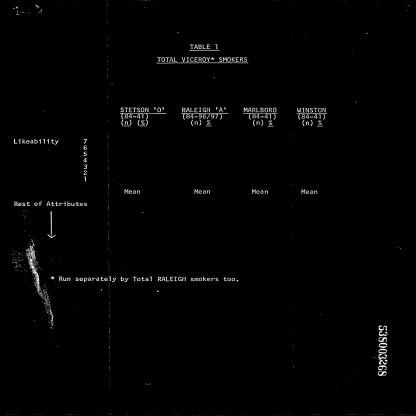

/n


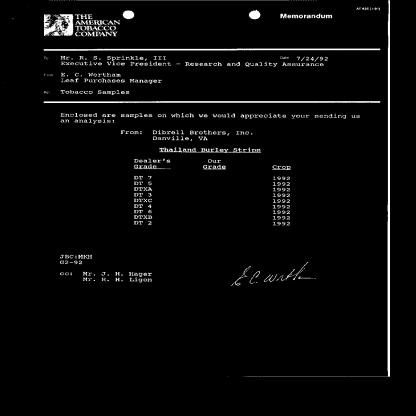

/n


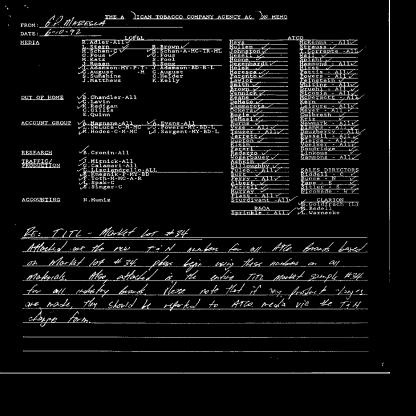

/n


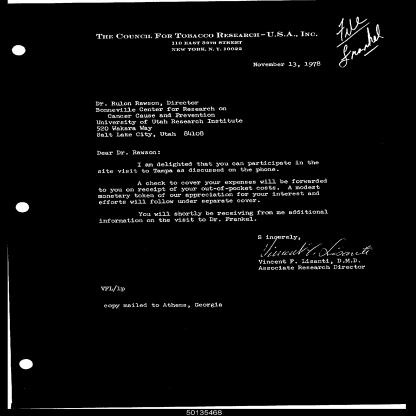

/n


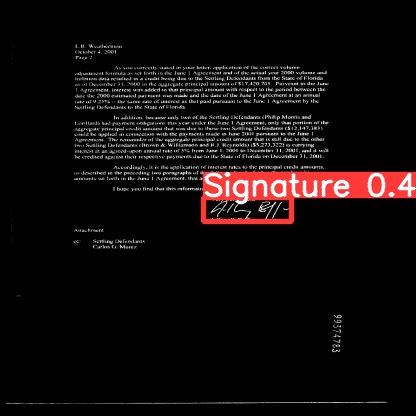

/n


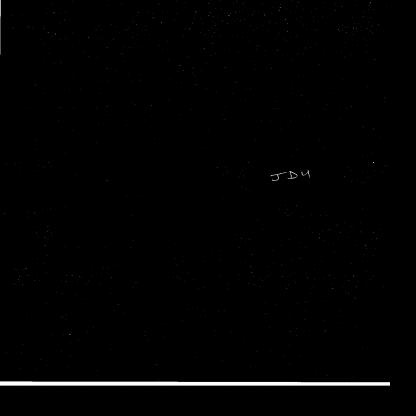

/n


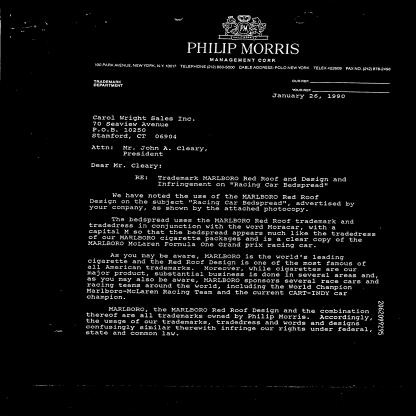

/n


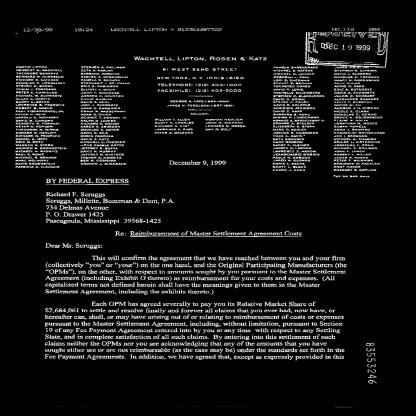

/n


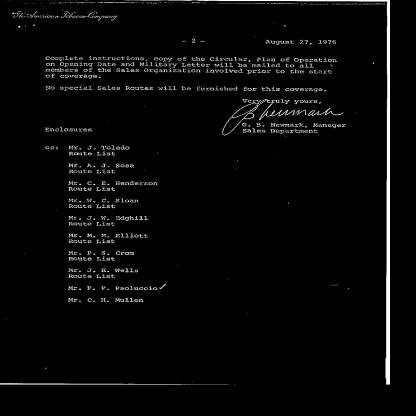

/n


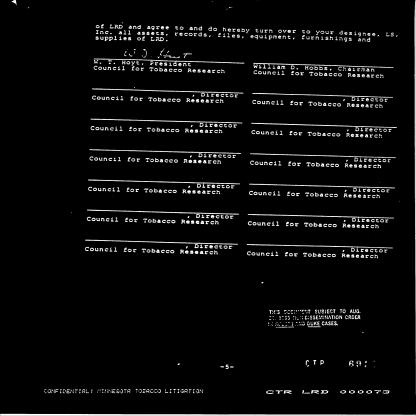

/n


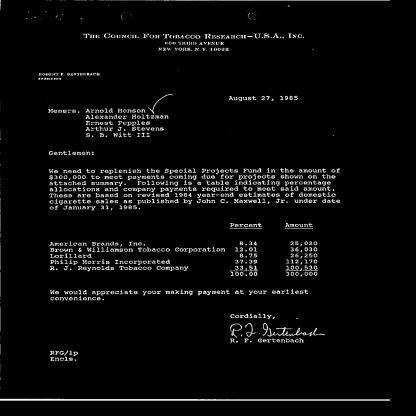

/n


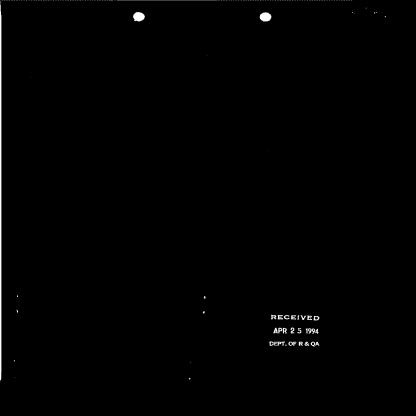

/n


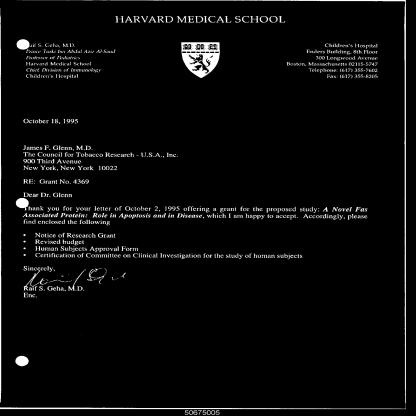

/n


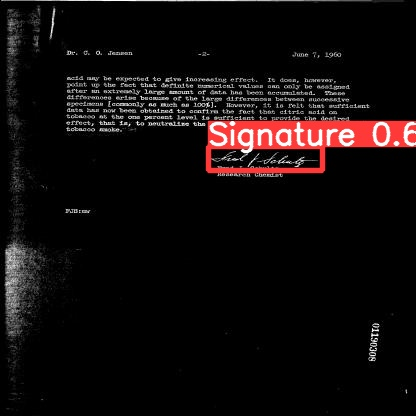

/n


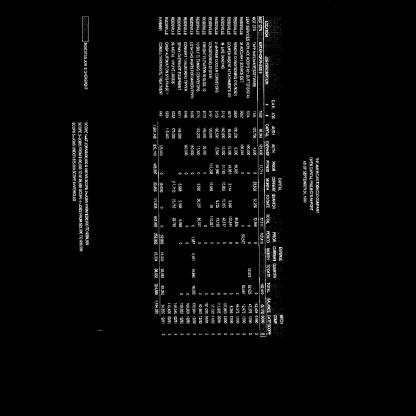

/n


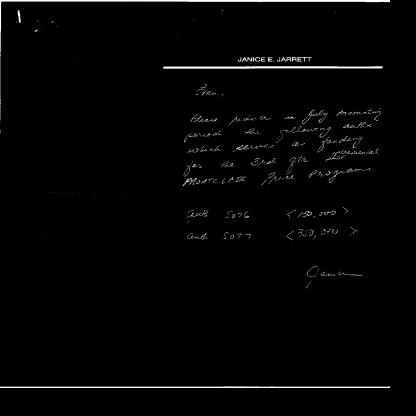

/n


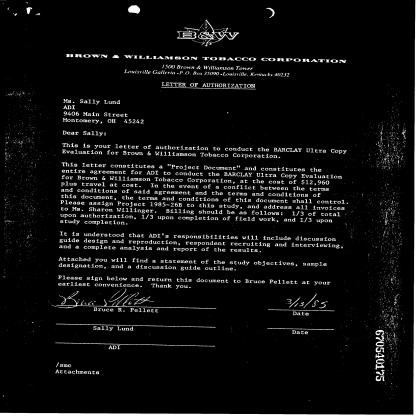

/n


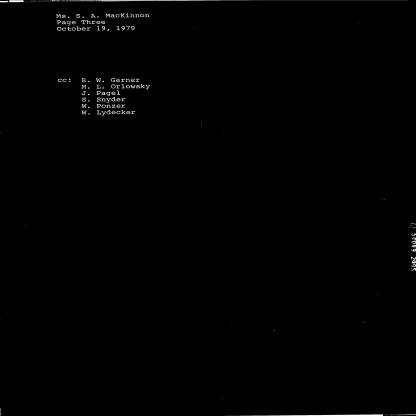

/n


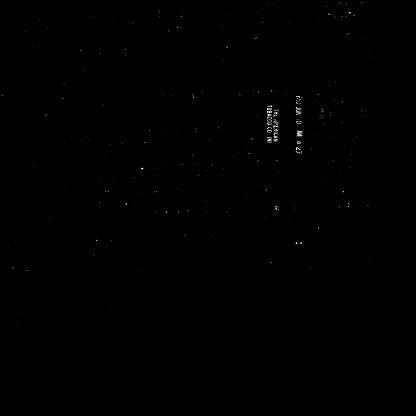

/n


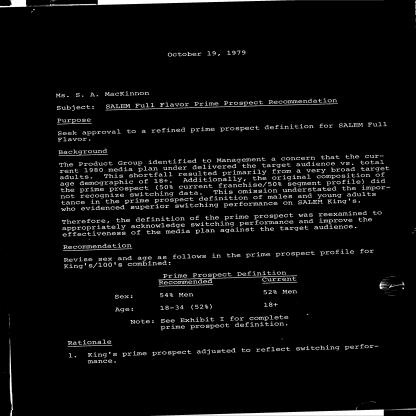

/n


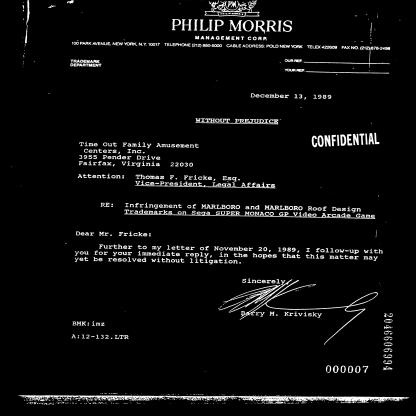

/n


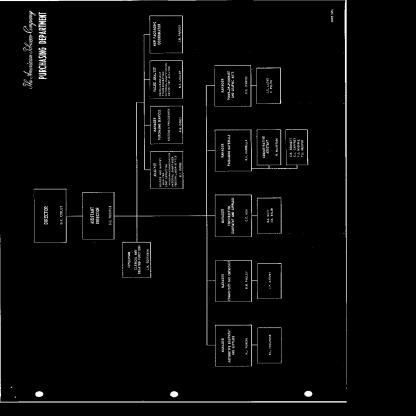

/n


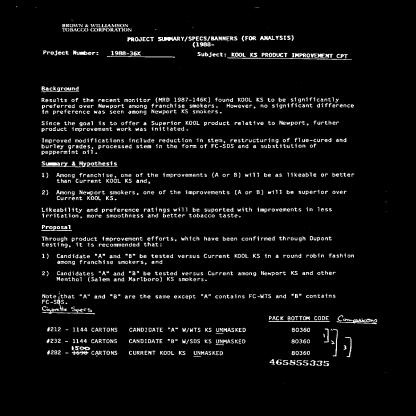

/n


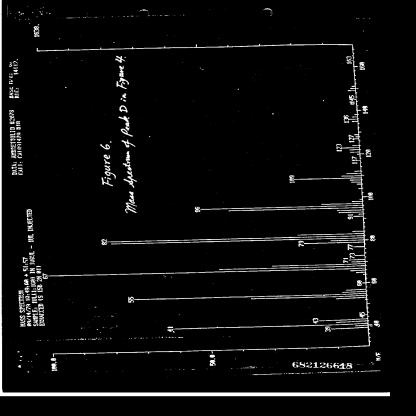

/n


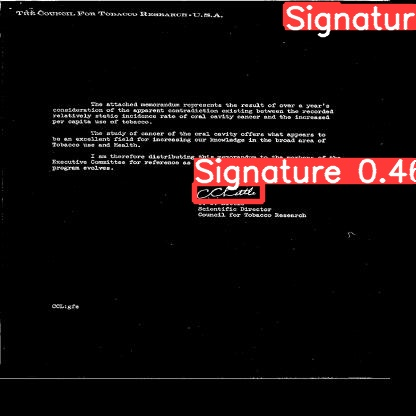

/n


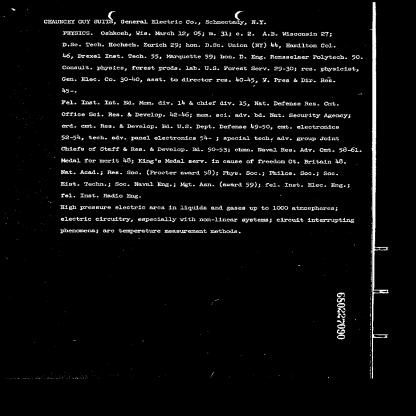

/n


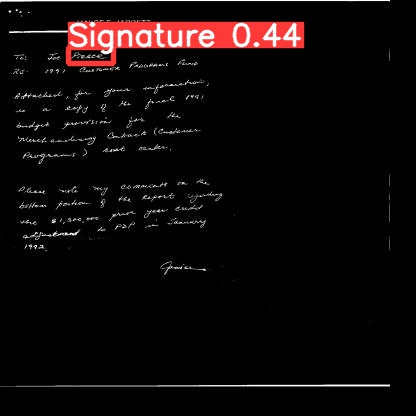

/n


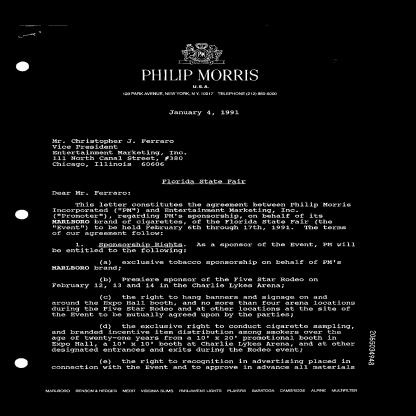

/n


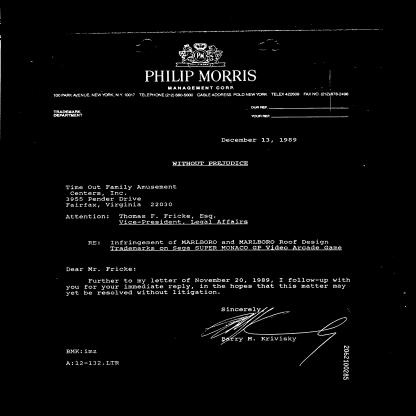

/n


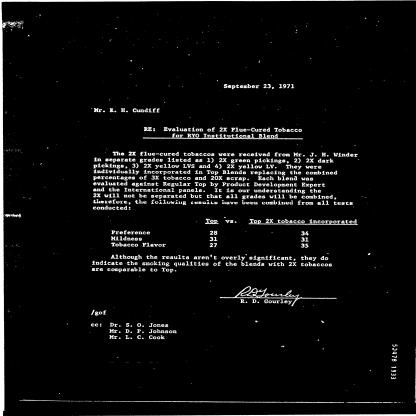

/n


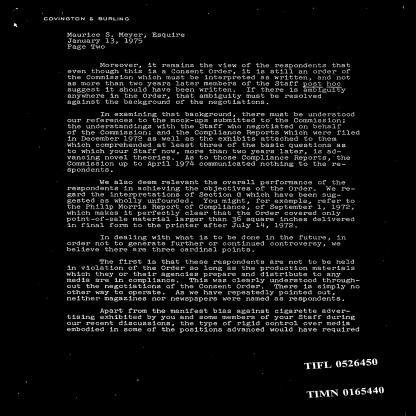

/n


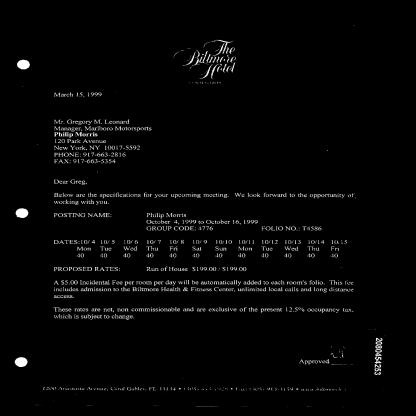

/n


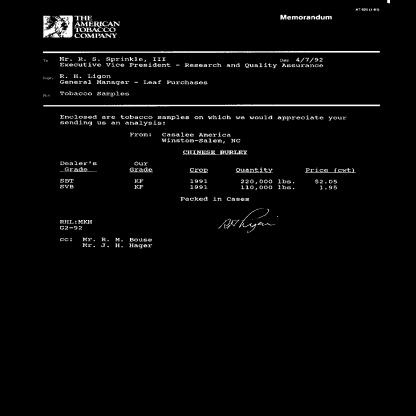

/n


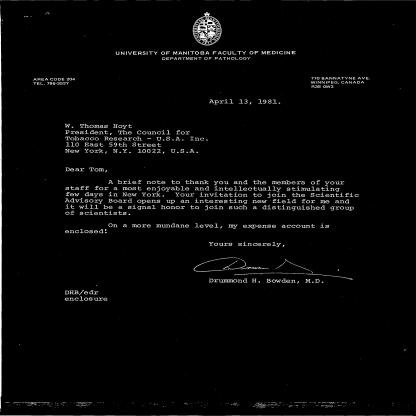

/n


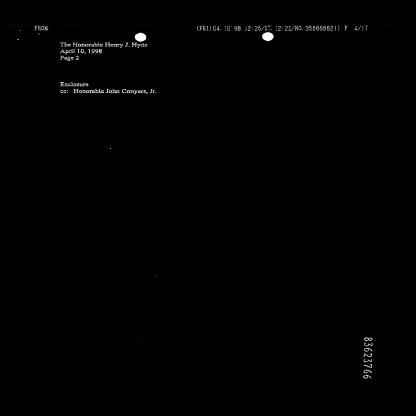

/n


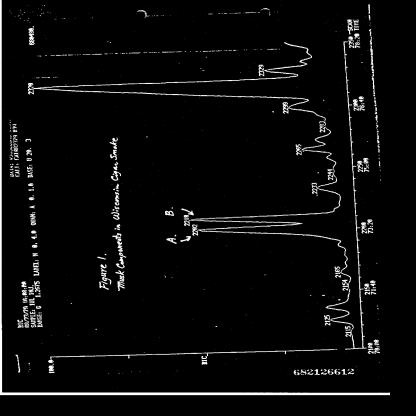

/n


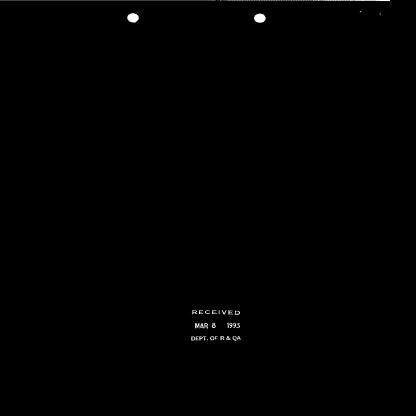

/n


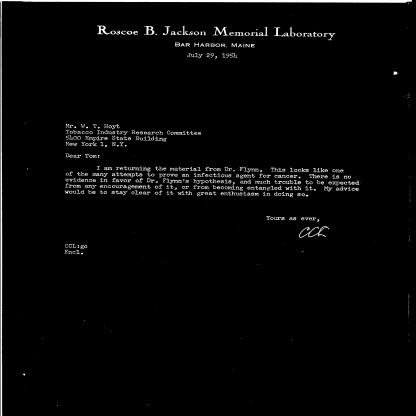

/n


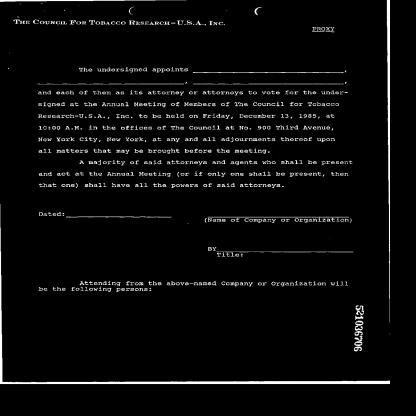

/n


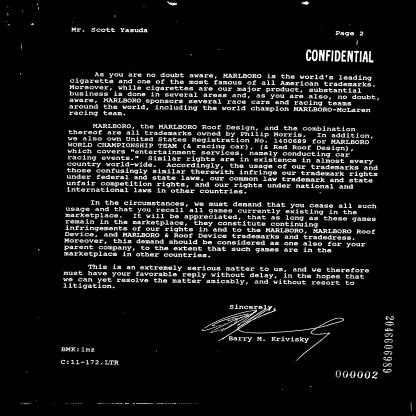

/n


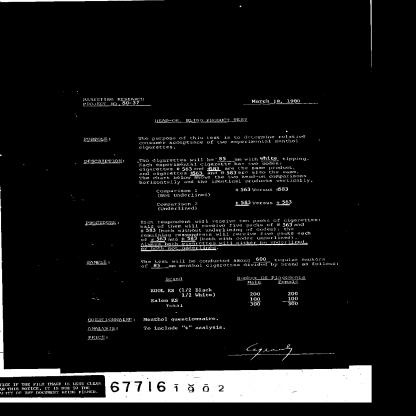

/n


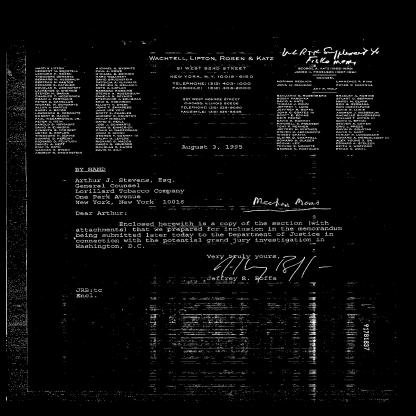

/n


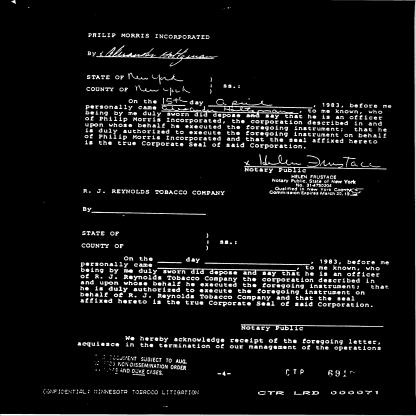

/n


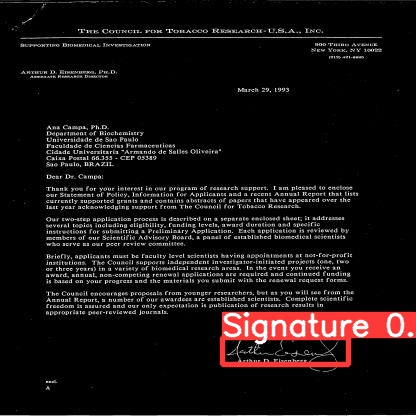

/n


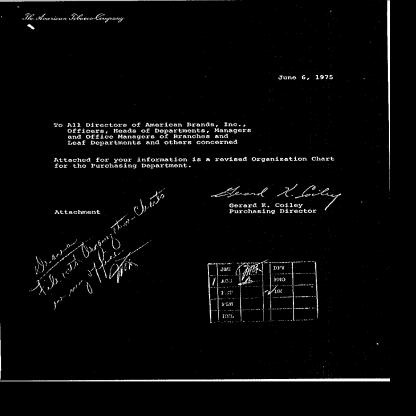

/n


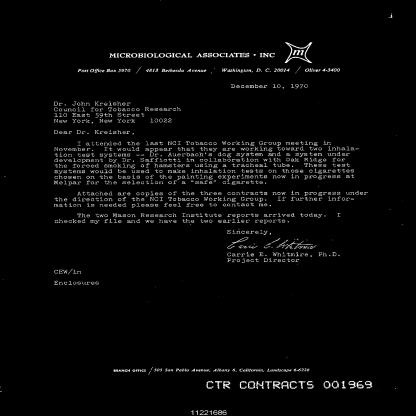

/n


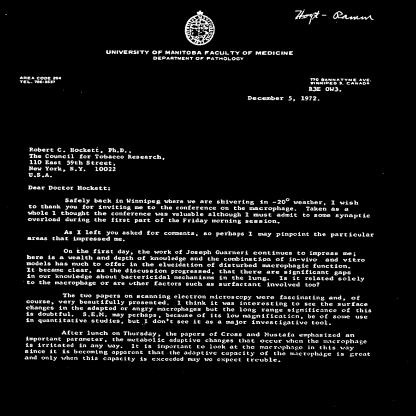

/n


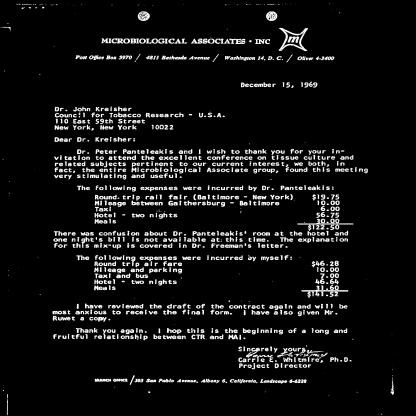

/n


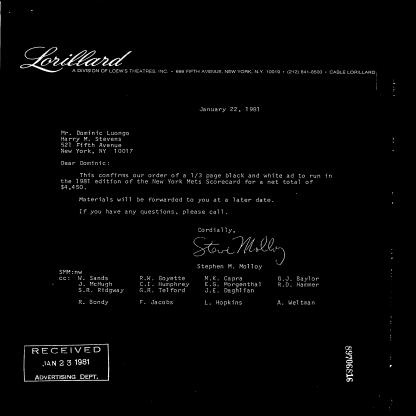

/n


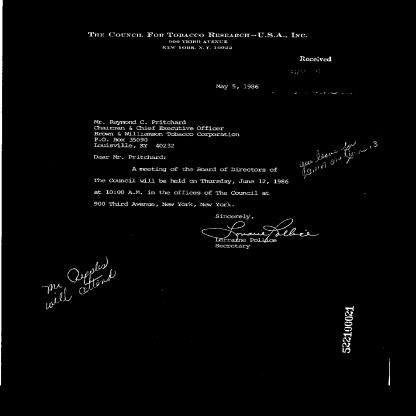

/n


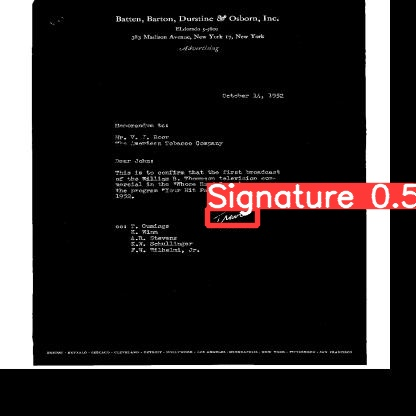

/n


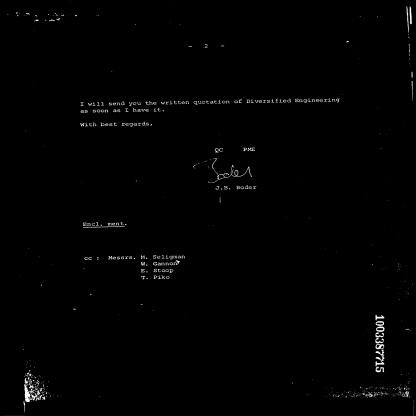

/n


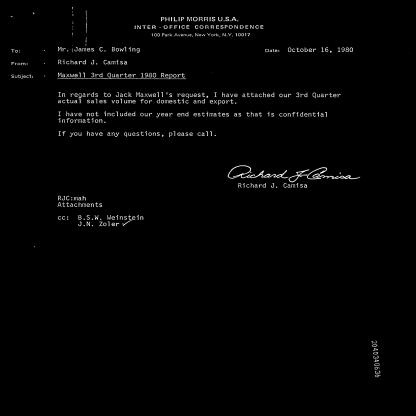

/n


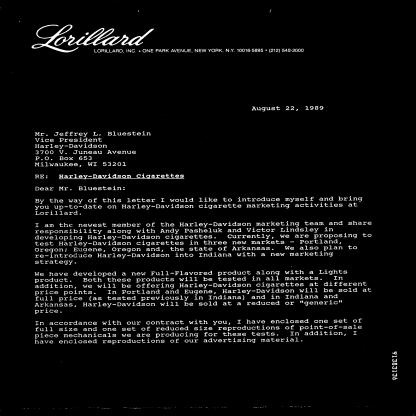

/n


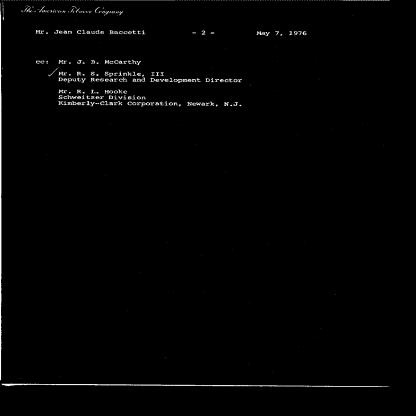

/n


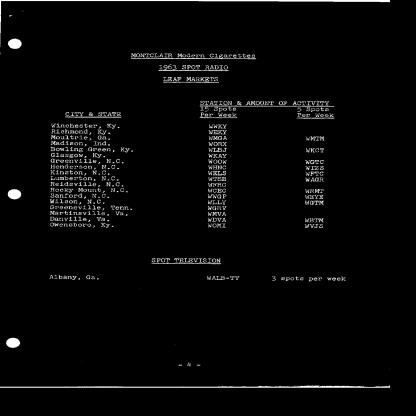

/n


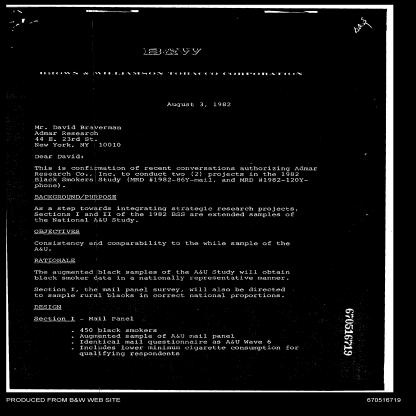

/n


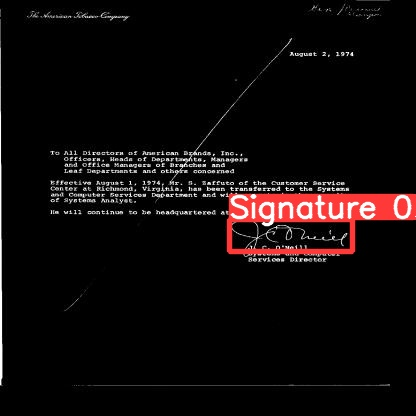

/n


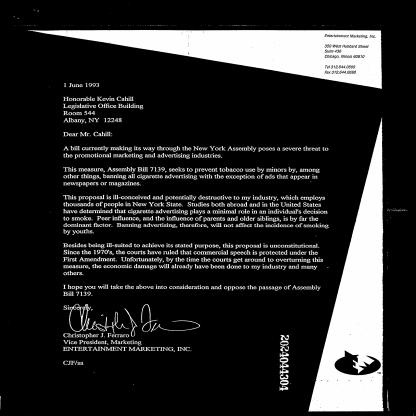

/n


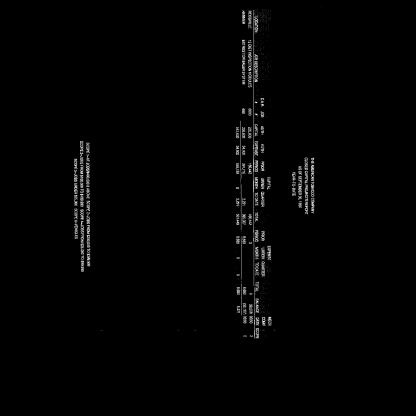

/n


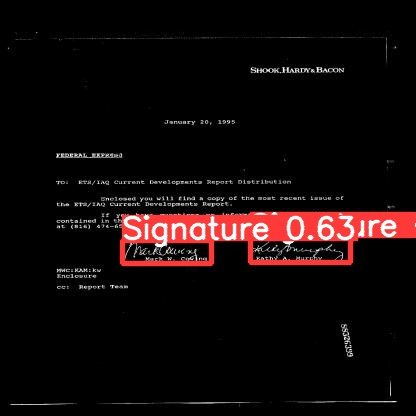

/n


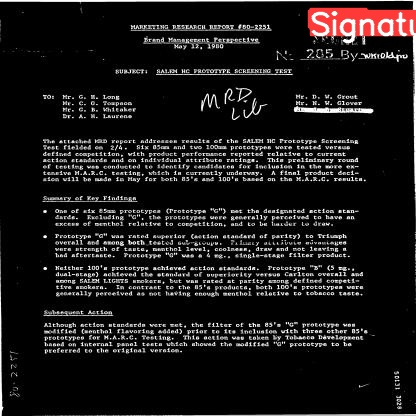

/n


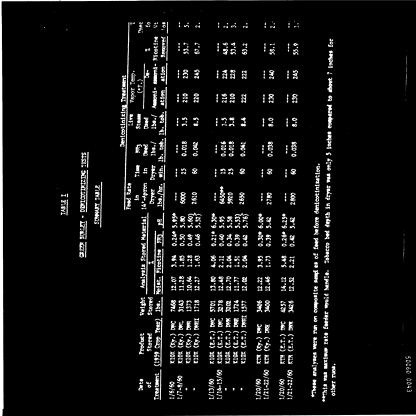

/n


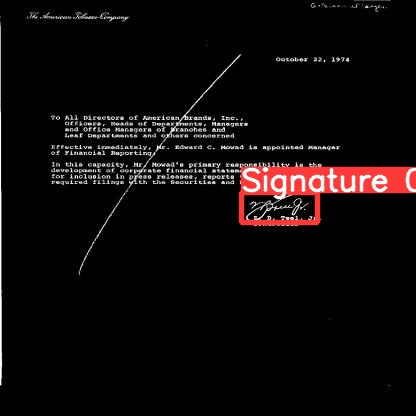

/n


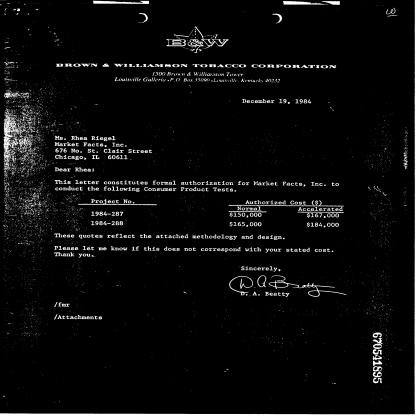

/n


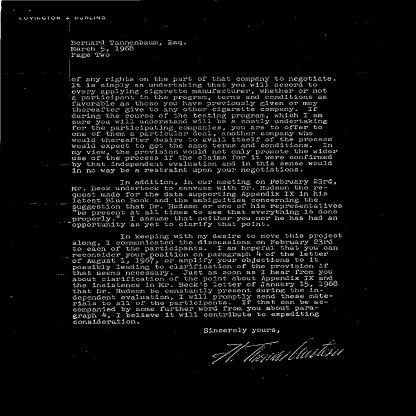

/n


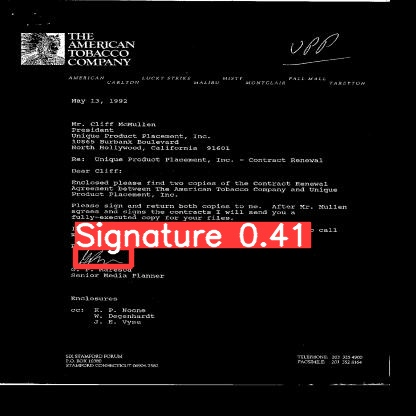

/n


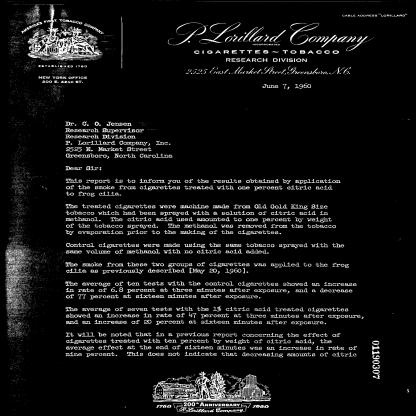

/n


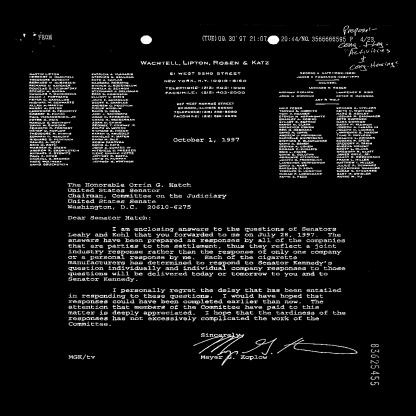

/n


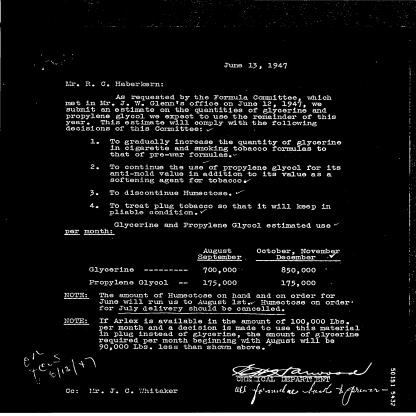

/n


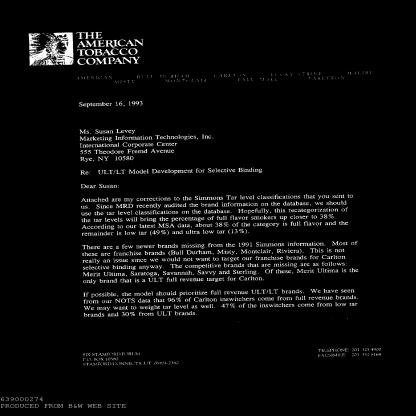

/n


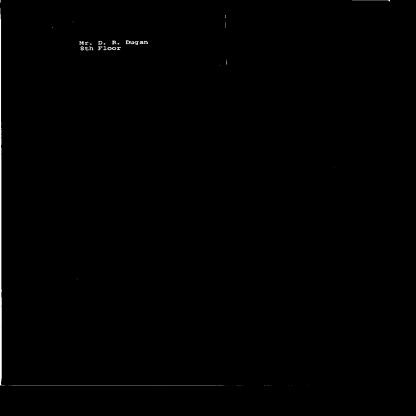

/n


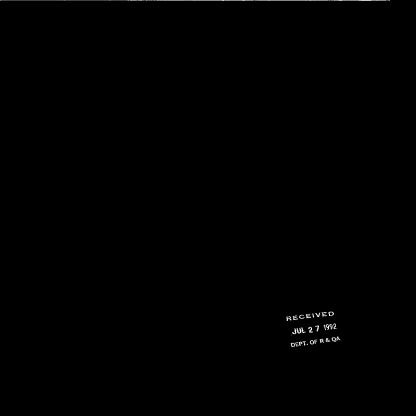

/n


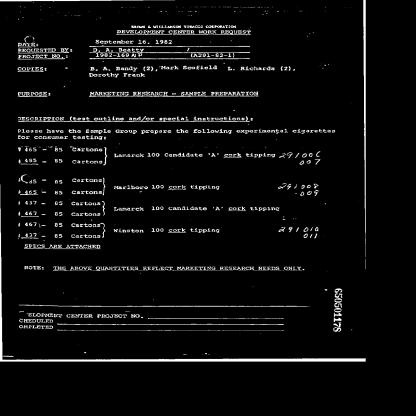

/n


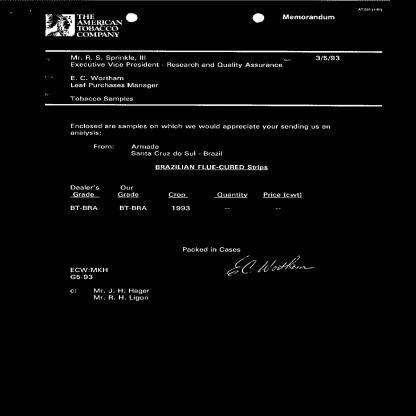

/n


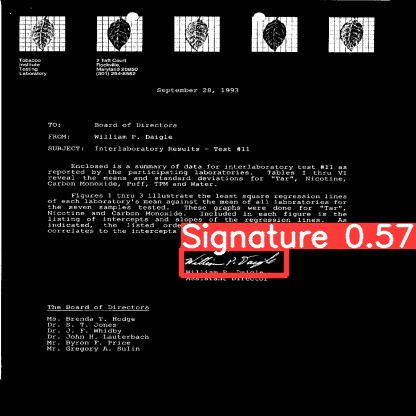

/n


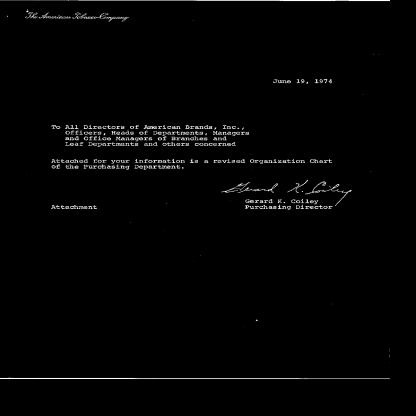

/n


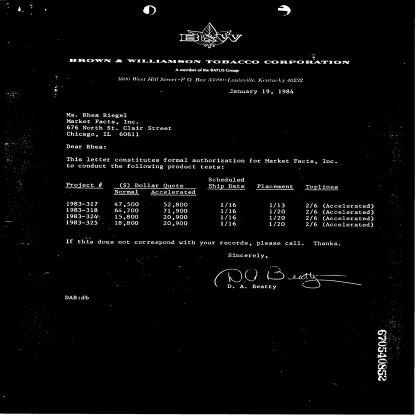

/n


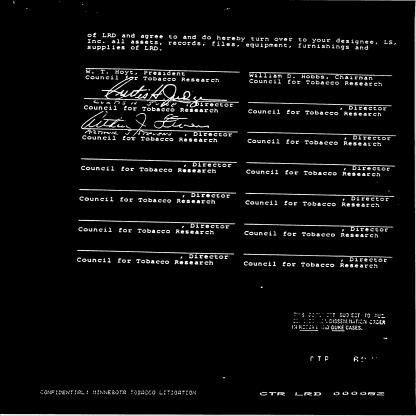

/n


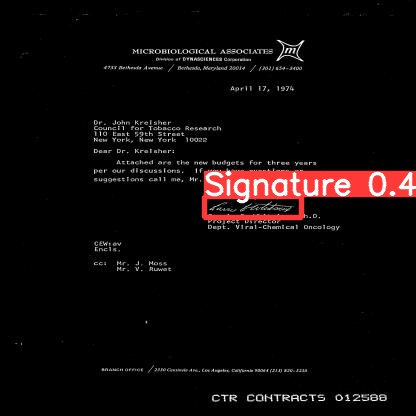

/n


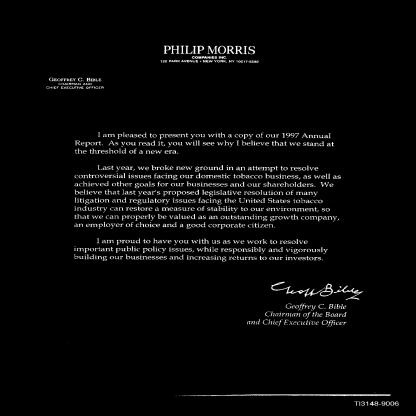

/n


In [ ]:
import glob
from IPython.display import Image, display
from IPython.core.display import Video
for imageName in glob.glob('/content/yolov5_signature/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename = imageName))
  print("/n")

In [ ]:

from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature2/weights/best.pt /content/gdrive/My\ Drive/signature_detector_best.pt

In [ ]:
import tensorflow as tf
print(tf.__version__)
!PYTHONPATH=. python3 /content/yolov5_signature/yolov5/models/tf.py --weight /content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature2/weights/best.pt --cfg models/custom_yolov5s_signature.yaml --img 640 --source /content/yolov5_signature/signature_data/train/images

In [ ]:
import glob
from PIL import Image

images=glob.glob("/content/yolov5_signature/signature_data/testing/images/*.jpg")
for image in images:
    img = Image.open(image)
    img1 = img.resize((640,640))
    img1.save(image)    

In [ ]:
%cd /content/yolov5_signature/yolov5/
!python detect.py --weight /content/yolov5_signature/yolov5/runs/train/yolov5s_results_signature2/weights/best-fp16.tflite --img 640 --source /content/yolov5_signature/signature_data/testing/images